In [2]:
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.preprocessing import scale
import itertools
# import NOTEARS
import notears.nt_linear as nt
import notears.nt_nonlinear as ntn
from dag_generator import DAGGenerator
from sklearn.preprocessing import scale
import scipy
from matplotlib import animation
import matplotlib.colors as colors
import matplotlib.cm as mplcm
import seaborn as sns
import os
import matplotlib as mpl

In [3]:
mpl.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 24
plt.rcParams['axes.linewidth'] = 2

In [3]:
# NOTE: Only execute this if the metadata-file hasn't been built yet!
dfs = []
for filename in os.listdir('./experiments/flip-experiment-fixed-data-as4-reg0.1/'):
    if 'metadata' in filename and filename != 'metadata.csv':
        df = pd.read_csv('./experiments/flip-experiment-fixed-data-as4-reg0.1/{}'.format(filename), index_col=0)
        dfs.append(df)
final_df = pd.concat(dfs)
exp_ids = np.arange(0, len(final_df))
final_df['Exp'] = exp_ids
final_df

,s_1,s_2,Exp,pid,success
0,-0.20,-5.75,0,12272,1
1,-2.25,-9.00,1,12272,0
2,-2.20,-8.95,2,12272,0
3,-1.75,-3.50,3,12272,1
4,-0.10,-0.20,4,12272,1
...,...,...,...,...,...
19995,-3.20,-9.75,159995,13796,0
19996,-2.95,8.80,159996,13796,0
19997,-4.60,1.40,159997,13796,0
19998,-3.15,6.70,159998,13796,0


In [4]:
final_df['adj_nr'] = final_df.index
final_df

,s_1,s_2,Exp,pid,success,adj_nr
0,-0.20,-5.75,0,12272,1,0
1,-2.25,-9.00,1,12272,0,1
2,-2.20,-8.95,2,12272,0,2
3,-1.75,-3.50,3,12272,1,3
4,-0.10,-0.20,4,12272,1,4
...,...,...,...,...,...,...
19995,-3.20,-9.75,159995,13796,0,19995
19996,-2.95,8.80,159996,13796,0,19996
19997,-4.60,1.40,159997,13796,0,19997
19998,-3.15,6.70,159998,13796,0,19998


In [5]:
final_df.to_csv('./experiments/flip-experiment-fixed-data-as4-reg0.1/metadata.csv')

In [6]:
def build_metadata(path):
    dfs = []
    for filename in os.listdir(path):
        if 'metadata' in filename and filename != 'metadata.csv':
            df = pd.read_csv(path + filename, index_col=0)
            dfs.append(df)
    final_df = pd.concat(dfs)
    exp_ids = np.arange(0, len(final_df))
    final_df['Exp'] = exp_ids
    final_df['adj_nr'] = final_df.index
    final_df.to_csv(path + 'metadata.csv')

## Load metadata

In [7]:
metadata_df = pd.read_csv('./experiments/flip-experiment-fixed-data-as4-reg0.1/metadata.csv', index_col=0)
metadata_df['scale_diff'] = metadata_df['s_1'] - metadata_df['s_2']
metadata_df

,s_1,s_2,Exp,pid,success,adj_nr,scale_diff
0,-0.20,-5.75,0,12272,1,0,5.55
1,-2.25,-9.00,1,12272,0,1,6.75
2,-2.20,-8.95,2,12272,0,2,6.75
3,-1.75,-3.50,3,12272,1,3,1.75
4,-0.10,-0.20,4,12272,1,4,0.10
...,...,...,...,...,...,...,...
19995,-3.20,-9.75,159995,13796,0,19995,6.55
19996,-2.95,8.80,159996,13796,0,19996,-11.75
19997,-4.60,1.40,159997,13796,0,19997,-6.00
19998,-3.15,6.70,159998,13796,0,19998,-9.85


In [8]:
expected_adj = np.array([[0, 0, 0],
                        [1, 0, 0], 
                        [0, 1, 0]])

In [9]:
adj_path = './experiments/flip-experiment-fixed-data-as{}-reg{}/adjacencies_{}/adj_{}.csv'
metadata_path = './experiments/flip-experiment-fixed-data-as{}-reg{}/'

In [10]:
def get_known_adjs(metadata_df, scale_, reg, expected_adj):
    known_adjs = []
    coefficients = {}
    success = 0
    overall = 0
    for _, row in metadata_df.iterrows():
        pid, adj_nr = int(row['pid']), int(row['adj_nr'])
        coeffs = [row['s_1'], row['s_2']]
        adj = pd.read_csv(adj_path.format(scale_, reg, pid, adj_nr), index_col=0).to_numpy()
        adj[adj != 0] = 1
        is_known = [np.all(adj == known_adj) for known_adj in known_adjs]
        if not np.any(is_known):
            adj_idx = len(known_adjs)
            known_adjs.append(adj)
            if adj_idx in coefficients.keys():
                coefficients[adj_idx].append(coeffs)
            else:
                coefficients[adj_idx] = [coeffs]
        elif len(known_adjs) > 0:
            adj_idx = np.argwhere(is_known)[0][0]
            coefficients[adj_idx].append(coeffs)
        if np.all(adj == expected_adj):
            success += 1
        overall += 1
    return known_adjs, coefficients, (success / overall)

In [12]:
def plot_success_vs_failure(known_adjs, coefficients, scale_, reg):
    fig = plt.figure(figsize=(12, 9))
    cm = plt.get_cmap('gist_rainbow')
    ax = fig.add_subplot(111)
    ax.tick_params(which='major', size=15, width=2, direction='in', right='on', top='on')
    ax.tick_params(which='minor', size=12, width=2, direction='in', right='on', top='on')
    for idx, adj in enumerate(known_adjs):
        plt_coeffs = np.array(coefficients[idx])
        if np.all(adj == expected_adj):
            scatter = ax.scatter(plt_coeffs[:, 0], plt_coeffs[:, 1], alpha=0.8)
            scatter.set_color('red')
            #scatter.set_label('Successful attack')
        else:
            scatter = ax.scatter(plt_coeffs[:, 0], plt_coeffs[:, 1], alpha=0.05)
            scatter.set_color('green')
            #scatter.set_label('Failed attack')
        
    red_patch, green_patch = mpl.patches.Patch(color='red', label='Successful Attack'), mpl.patches.Patch(color='green', label='Failed Attack')
    plt.xlabel(r'Scale of $X_1$')
    plt.ylabel(r'Scale of $X_2$')
    plt.legend(handles=[red_patch, green_patch], loc='upper right')
    plt.savefig(f'./success_vs_fail_{scale_}_{reg}.svg')

Success ration of attack with scale 2 and reg 0: 0.3502625
Success ration of attack with scale 2 and reg 0.01: 0.3187625
Success ration of attack with scale 2 and reg 0.1: 0.234725
Success ration of attack with scale 2 and reg 1: 0.0
Success ration of attack with scale 4 and reg 0: 0.29563125
Success ration of attack with scale 4 and reg 0.01: 0.28299375
Success ration of attack with scale 4 and reg 0.1: 0.15140625
Success ration of attack with scale 4 and reg 1: 0.0
Success ration of attack with scale 8 and reg 0: 0.2289125
Success ration of attack with scale 8 and reg 0.01: 0.21236875
Success ration of attack with scale 8 and reg 0.1: 0.0966125
Success ration of attack with scale 8 and reg 1: 0.0
Success ration of attack with scale 10 and reg 0: 0.19145625
Success ration of attack with scale 10 and reg 0.01: 0.1886375
Success ration of attack with scale 10 and reg 0.1: 0.09280625
Success ration of attack with scale 10 and reg 1: 0.0


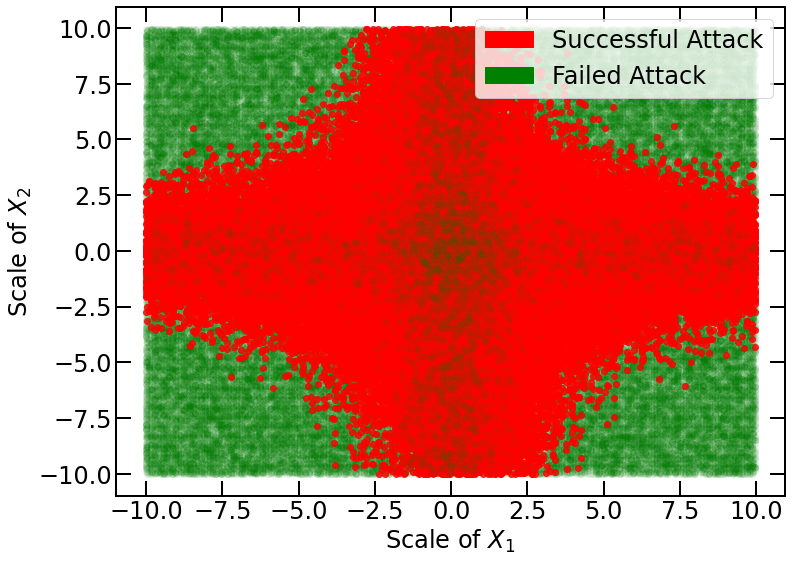

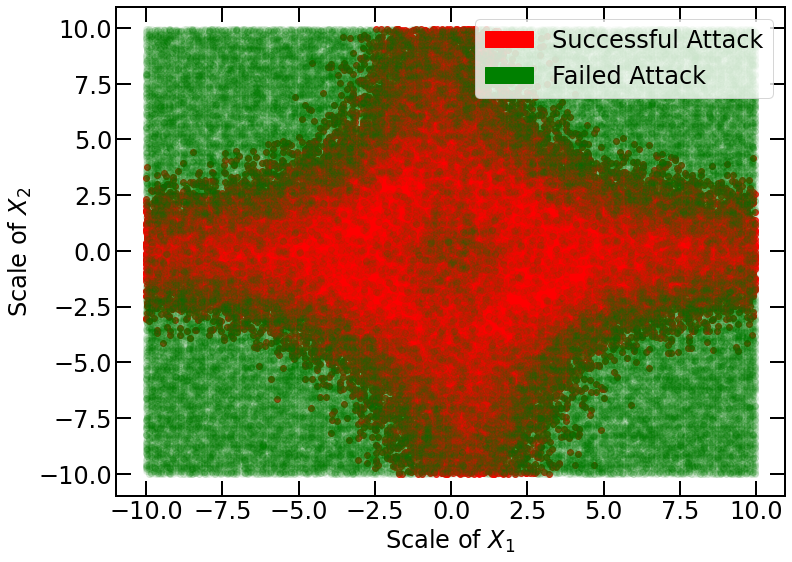

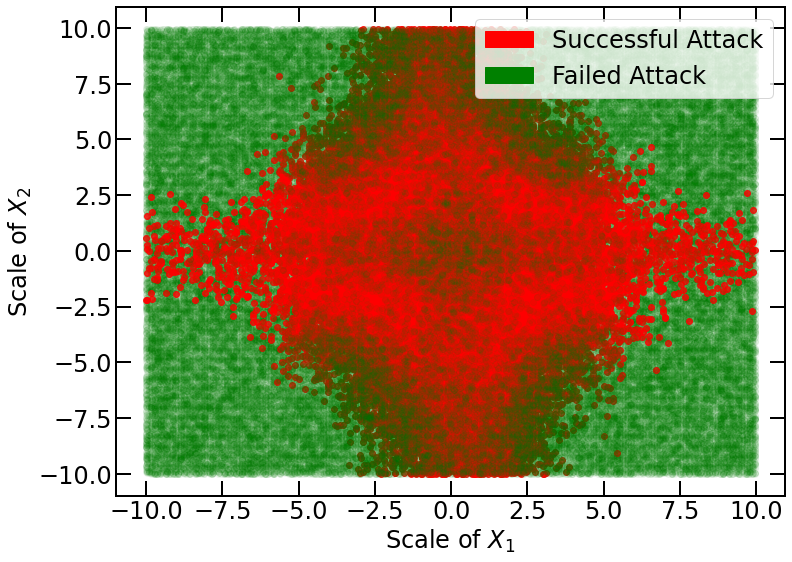

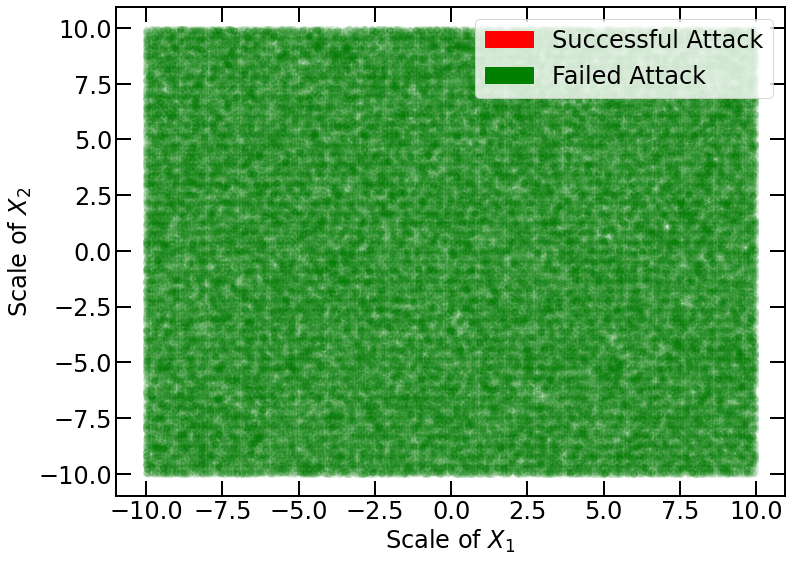

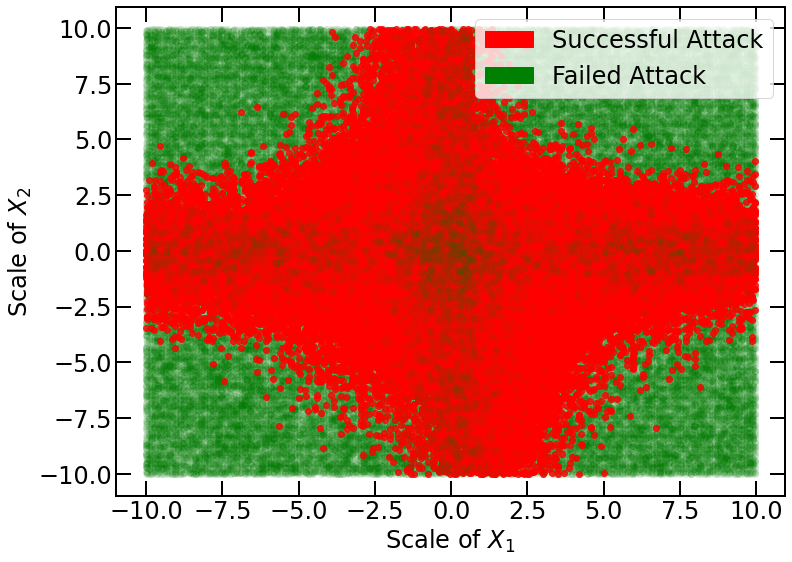

...

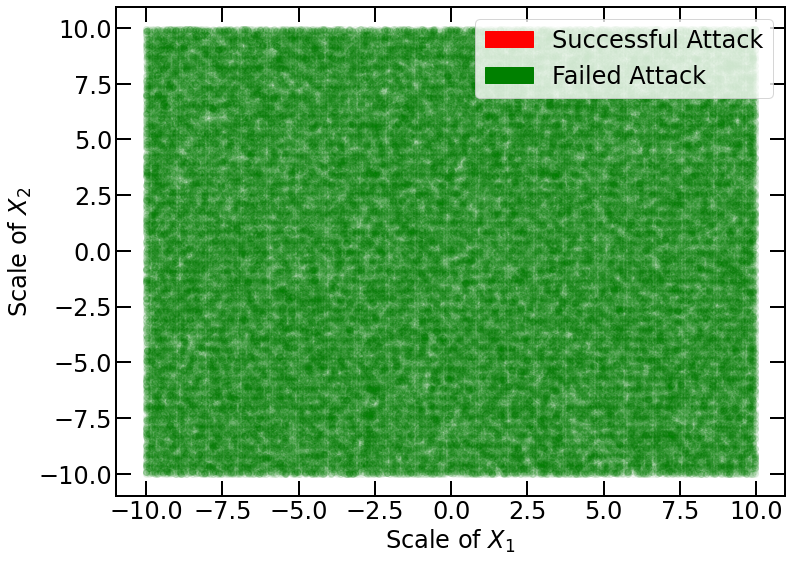

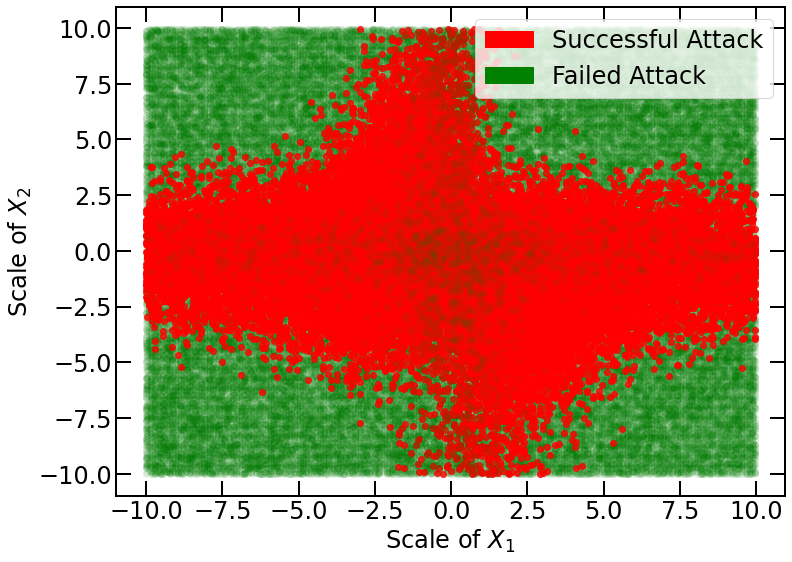

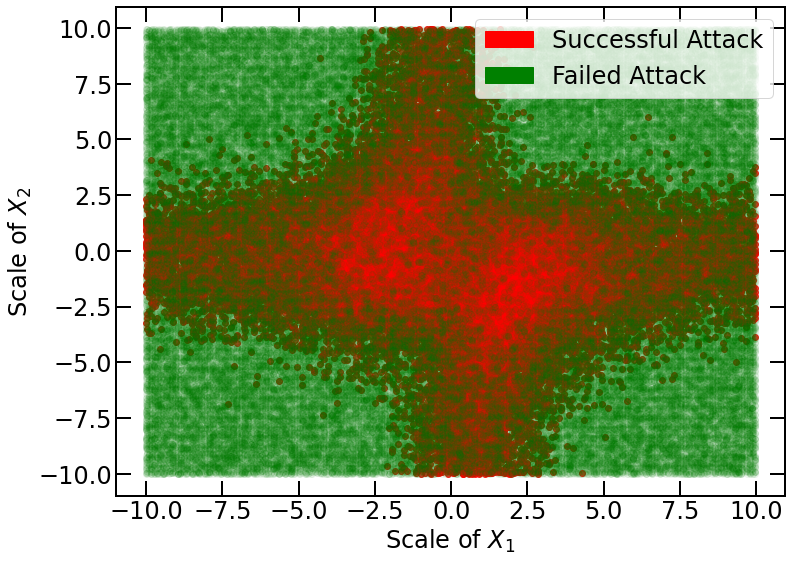

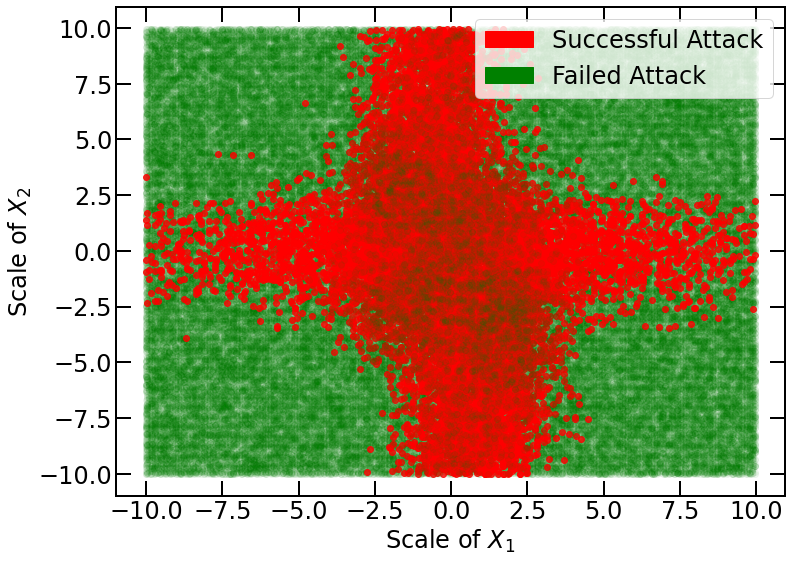

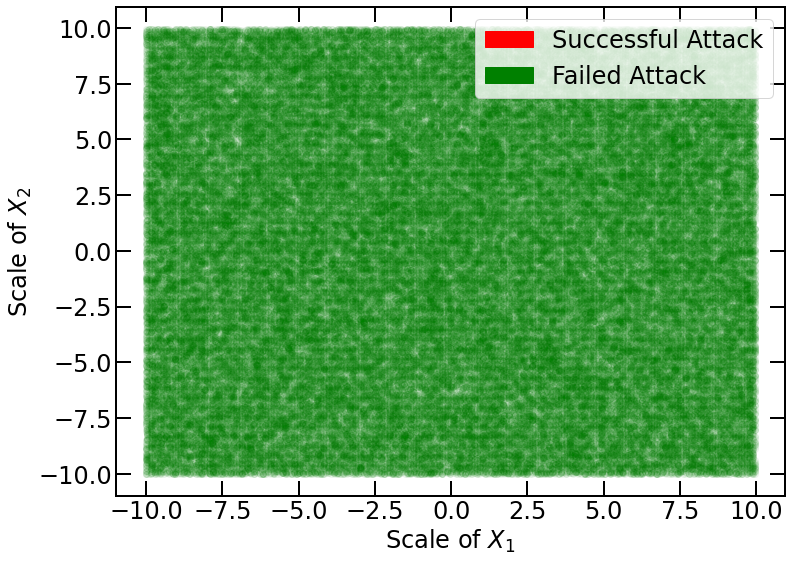

In [13]:
parameters = itertools.product([2, 4, 8, 10], [0, 0.01, 0.1, 1])
for scale_, reg in parameters:
    #build_metadata(f'./experiments/flip-experiment-fixed-data-as{scale_}-reg{reg}/')
    metadata_df = pd.read_csv(f'./experiments/flip-experiment-fixed-data-as{scale_}-reg{reg}/metadata.csv', index_col=0)
    metadata_df['scale_diff'] = metadata_df['s_1'] - metadata_df['s_2']
    known_adjs, coeffs, success_ratio = get_known_adjs(metadata_df, scale_, reg, expected_adj)
    print(f"Success ration of attack with scale {scale_} and reg {reg}: {success_ratio}")
    plot_success_vs_failure(known_adjs, coeffs, scale_, reg)

In [38]:
error_types = []
for idx, row in metadata_df.iterrows():
    pid, adj_nr = int(row['pid']), int(row['adj_nr'])
    adj = pd.read_csv(adj_path.format(pid, adj_nr), index_col=0).to_numpy()
    adj[adj != 0] = 1
    if np.all(adj == expected_adj):
        error_types.append(-5)
    else:
        for i, kadj in enumerate(known_adjs):
            if np.all(kadj == adj):
                error_types.append(i)

metadata_df['ErrorType'] = error_types

## $n$-node case

In [4]:
NODE_SIZE = 2000
ARROW_SIZE = 20
LINEWIDTH = 1

In [48]:
df = pd.read_csv('./data/n-var-case/linear/data/data_10_15.csv', index_col=0)
df

,0,1,2,3,4,5,6,7,8,9
0,4.345246,360.677743,1.544766,-0.558336,-1.017856,3425.828324,7.317865,563.742808,25.699945,61.417920
1,2.953166,-127.339172,-2.143855,-4.243880,0.947402,12.958430,-2.265753,3.237464,14.451346,-21.226223
2,2.770028,154.011327,4.660953,-1.583841,-0.418361,1769.479227,2.432377,292.336799,12.551537,26.184169
3,3.908807,154.355915,5.838679,1.339654,-1.331844,2954.154570,3.515430,489.699445,33.382589,25.467835
4,-0.252369,-218.357897,-3.281040,-2.633632,0.065432,-1741.910784,-4.098543,-287.242737,-7.774664,-35.996829
...,...,...,...,...,...,...,...,...,...,...
9995,-3.208471,-92.297279,-0.820537,-2.520716,-1.577000,-2006.177817,-0.506267,-334.638380,-26.470474,-17.739091
9996,2.081877,375.421218,1.761182,-1.338562,5.499350,2953.022589,4.095858,489.579236,14.880415,66.296096
9997,-6.394347,-27.082000,-3.577363,4.378542,-2.564566,-2400.826851,0.471459,-401.171084,-38.098757,-4.875261
9998,-2.677885,-102.832919,1.112444,-4.011906,-4.574785,-1807.908845,-0.355276,-302.129326,-24.154334,-18.409303


In [81]:
nt_pred = nt.notears_linear(df.to_numpy(), 0.05, 'l2', log_gradients=False, gradient_log_dir='./', rand_init=False)
nt_pred[nt_pred != 0] = 1
nt_pred

array([[0., 0., 0., 0., 0., 1., 0., 1., 1., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 1., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
       [0., 1., 0., 0., 0., 1., 0., 1., 0., 1.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 1., 0., 1., 0., 1.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 1., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0., 1., 0., 0.]])

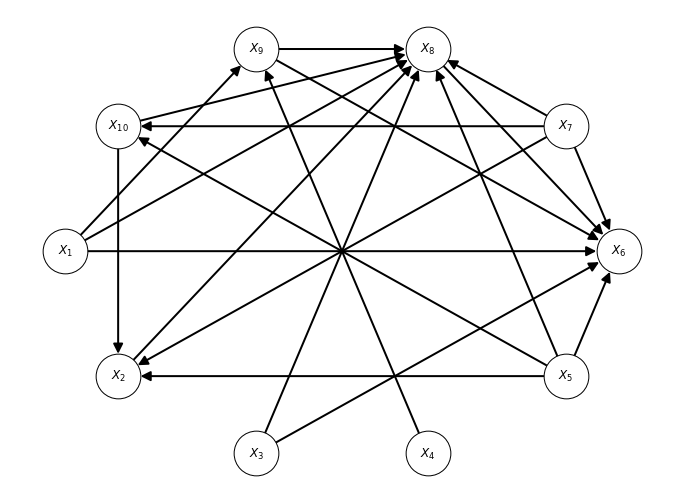

In [82]:
g = nx.convert_matrix.from_numpy_array(nt_pred, create_using=nx.DiGraph)
labels = {node: fr"$X_" + "{" + fr"{node + 1}" + "}$" for node in g.nodes}
fig = plt.figure(figsize=(12, 9))
nx.draw_shell(g, with_labels=True, node_size=NODE_SIZE, node_color='white', width=2, arrowsize=ARROW_SIZE, linewidths=LINEWIDTH, edgecolors='black', labels=labels, ax=fig.add_subplot(111))

In [84]:
fig.savefig('nt_pred.svg')

In [9]:
print(df['3'].std())
print(df['8'].std())
print(df['7'].std())
print(df['0'].std())

2.9844923996696022
23.105794196700767
266.28711522828235
2.9972630850923996


In [76]:
dfs = df.copy()
# flipping 3 -> 8
#dfs['8'] *= 1/5
#dfs['3'] *= 2

# flipping 0 -> 7 -> 8
#dfs['7'] *= 1/10
#dfs['8'] *= 2
#dfs['0'] *= 15

# collider at 8
#dfs['7'] *= 1/10
#dfs['8'] *= 2

#fork at 8
dfs['8'] *= 1/5
dfs['0'] *= 10

In [77]:
nt_pred = nt.notears_linear(dfs.to_numpy(), 0.05, 'l2', log_gradients=False, gradient_log_dir='./', rand_init=False)
nt_pred[nt_pred != 0] = 1

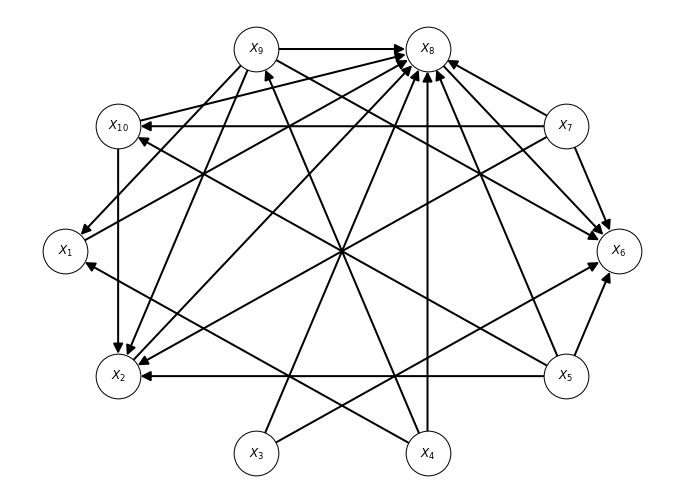

In [78]:
g = nx.convert_matrix.from_numpy_array(nt_pred, create_using=nx.DiGraph)
fig = plt.figure(figsize=(12, 9))
nx.draw_shell(g, with_labels=True, node_size=NODE_SIZE, node_color='white', width=2, arrowsize=ARROW_SIZE, linewidths=LINEWIDTH, edgecolors='black', labels=labels, ax=fig.add_subplot(111))

In [79]:
fig.savefig('nt_pred_attack_fork.svg')

## $n$-node case NT nonlinear

In [25]:
df = pd.read_csv('./data/n-var-case/linear/data/data_10_15.csv', index_col=0)
model = ntn.NotearsMLP((10, 5, 1))
nt_pred = ntn.notears_nonlinear(model, df.to_numpy(), lambda1=0.05, lambda2=0.05)
nt_pred[nt_pred >= 0.3] = 1
nt_pred

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 0., 1., 1., 0., 1., 1., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 1., 0., 1., 0., 1., 1., 0., 1., 1.],
       [1., 0., 0., 1., 0., 1., 1., 0., 0., 0.],
       [0., 1., 0., 0., 0., 1., 0., 0., 1., 0.]], dtype=float32)

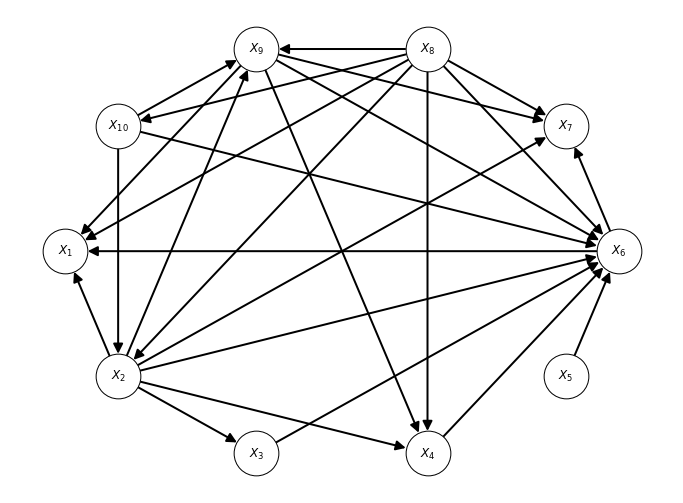

In [26]:
g = nx.convert_matrix.from_numpy_array(nt_pred, create_using=nx.DiGraph)
labels = {node: fr"$X_" + "{" + fr"{node + 1}" + "}$" for node in g.nodes}
fig = plt.figure(figsize=(12, 9))
nx.draw_shell(g, with_labels=True, node_size=NODE_SIZE, node_color='white', width=2, arrowsize=ARROW_SIZE, linewidths=LINEWIDTH, edgecolors='black', labels=labels, ax=fig.add_subplot(111))

In [60]:
# print(df['3'].std())
print(df['1'].std())
print(df['3'].std())
print(df['5'].std())

181.86994531067603
2.9844923996696022
1604.630302566156


In [70]:
dfs = df.copy()
# flipping 5 -> 6 -> 7
dfs['1'] *= 10
dfs['3'] *= 100
dfs['5'] *= 0.01

# flipping 0 -> 7 -> 8
#dfs['7'] *= 1/10
#dfs['8'] *= 2
#dfs['0'] *= 15

# collider at 8
#dfs['7'] *= 1/10
#dfs['8'] *= 2

#fork at 8
#dfs['8'] *= 1/5
#dfs['0'] *= 10

In [71]:
# print(df['3'].std())
print(dfs['1'].std())
print(dfs['3'].std())
print(dfs['5'].std())

1818.699453106759
298.4492399669603
16.046303025661526


In [72]:
nt_pred = ntn.notears_nonlinear(model, df.to_numpy(), lambda1=0.05, lambda2=0.05)
nt_pred[nt_pred >= 0.3] = 1
nt_pred

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 0., 1., 1., 0., 1., 1., 0., 1., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 1., 0., 1., 0., 1., 1., 0., 1., 1.],
       [1., 0., 0., 1., 0., 1., 1., 0., 0., 0.],
       [0., 1., 0., 0., 0., 1., 0., 0., 1., 0.]], dtype=float32)

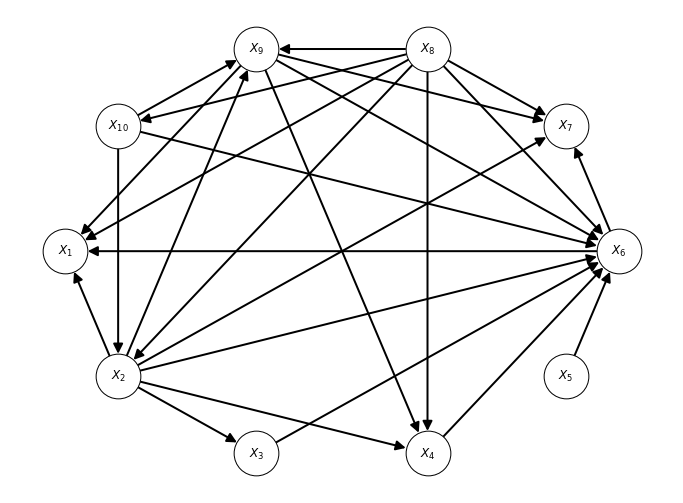

In [73]:
g = nx.convert_matrix.from_numpy_array(nt_pred, create_using=nx.DiGraph)
labels = {node: fr"$X_" + "{" + fr"{node + 1}" + "}$" for node in g.nodes}
fig = plt.figure(figsize=(12, 9))
nx.draw_shell(g, with_labels=True, node_size=NODE_SIZE, node_color='white', width=2, arrowsize=ARROW_SIZE, linewidths=LINEWIDTH, edgecolors='black', labels=labels, ax=fig.add_subplot(111))

## Real Worl Data

In [3]:
from sklearn.preprocessing import scale

In [4]:
df = pd.read_csv('./data/real-world/sachs.data.txt', sep='\t')

In [41]:
dfs = df.copy()
for c in dfs.columns:
    dfs.loc[:, c] = np.log(dfs[c])
# chain flip
#dfs['PIP2'] *= 0.5
#dfs['PIP3'] *= 2
#dfs['Mek'] *= 8

# collider
#dfs['PIP3'] *= 2

# fork
dfs['PIP3'] *= 0.2

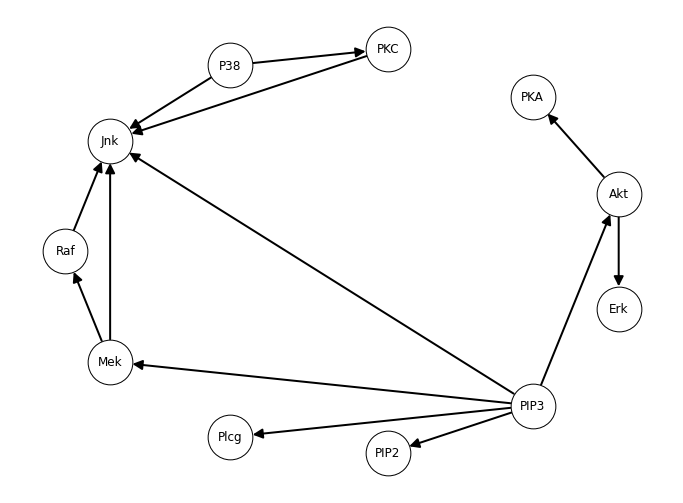

In [42]:
nt_pred = nt.notears_linear(dfs.to_numpy(), 0.0, 'l2', log_gradients=False, gradient_log_dir='./', rand_init=False, w_threshold=0.1)
nt_pred[nt_pred != 0] = 1
g = nx.convert_matrix.from_numpy_array(nt_pred, create_using=nx.DiGraph)
labels = {node: dfs.columns[node] for node in g.nodes}
fig = plt.figure(figsize=(12, 9))
nx.draw_shell(g, with_labels=True, node_size=NODE_SIZE, node_color='white', width=2, arrowsize=ARROW_SIZE, linewidths=LINEWIDTH, edgecolors='black', labels=labels, ax=fig.add_subplot(111))

In [43]:
fig.savefig('./nt_pred_sachs_fork.svg')

## Sachs NT nonlinear

In [26]:
df = pd.read_csv('./data/real-world/sachs.data.txt', sep='\t')

In [27]:
df /= df.max()

In [28]:
print(df['PKA'].std())
print(df['Akt'].std())
print(df['Erk'].std())

0.09525715889305089
0.03562877442984347
0.034963763593504886


In [29]:
# collider
df['Akt'] *= 8
df['PKA'] *= 1/8

# chain flip
#df['Akt'] *= 8

# fork
#df['Erk'] *= 4

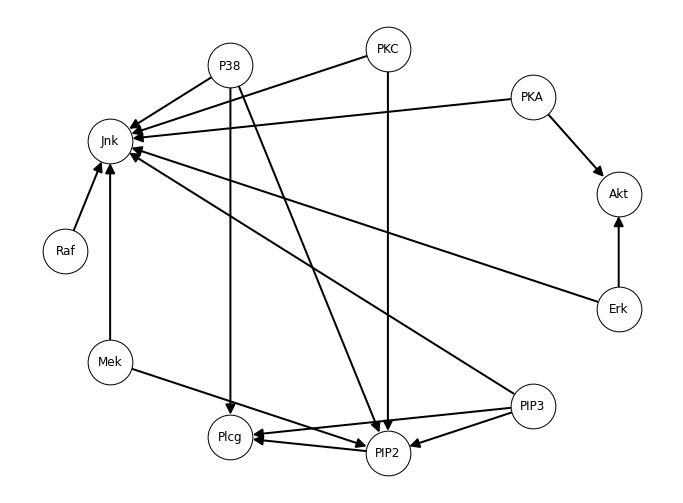

In [30]:
model = ntn.NotearsMLP((df.shape[1], 5, 1))
nt_pred = ntn.notears_nonlinear(model, df.to_numpy(), lambda1=1e-5, lambda2=0.0)
nt_pred[nt_pred >= 0.3] = 1

g = nx.convert_matrix.from_numpy_array(nt_pred, create_using=nx.DiGraph)
labels = {node: df.columns[node] for node in g.nodes}
fig = plt.figure(figsize=(12, 9))
nx.draw_shell(g, with_labels=True, node_size=NODE_SIZE, node_color='white', width=2, arrowsize=ARROW_SIZE, linewidths=LINEWIDTH, edgecolors='black', labels=labels, ax=fig.add_subplot(111))

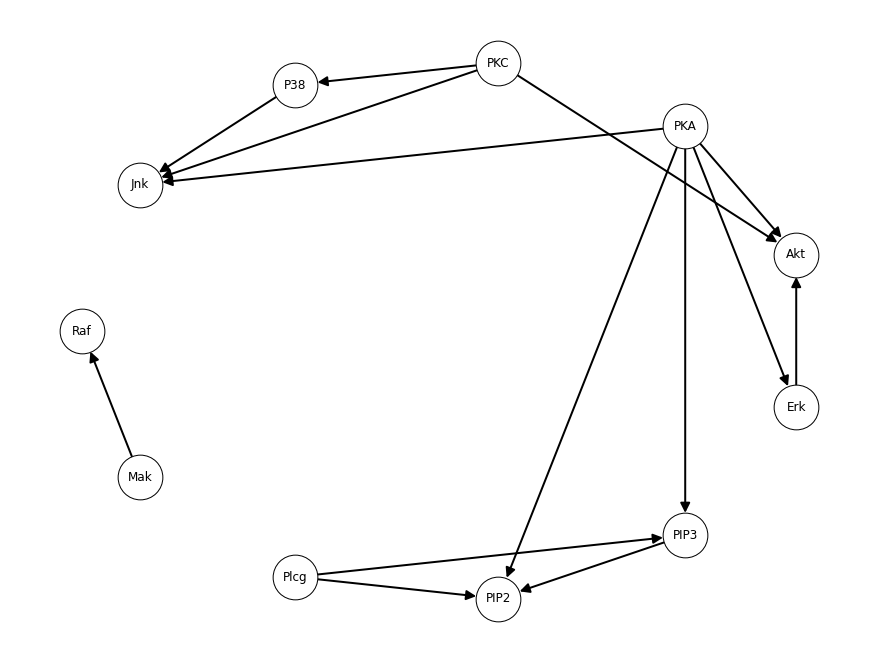

In [20]:
adj = np.loadtxt('./logs/sachs-attack-nt/attack_5_6_7_collider')
labels = {0: 'Raf', 1: 'Mak', 2: 'Plcg', 3: 'PIP2', 4: 'PIP3', 5: 'Erk', 6: 'Akt', 7: 'PKA', 8: 'PKC', 9: 'P38', 10: 'Jnk'}
g = nx.convert_matrix.from_numpy_array(adj, create_using=nx.DiGraph)
fig = plt.figure(figsize=(12, 9))
nx.draw_shell(g, with_labels=True, node_size=NODE_SIZE, node_color='white', width=2, arrowsize=ARROW_SIZE, linewidths=LINEWIDTH, edgecolors='black', labels=labels)
plt.savefig('./sachsnt.pdf')

## DAG-GNN predictions

In [5]:
for i in range(len(df.columns)):
    col = df.columns[i]
    print(f"{i}: {df.columns[i]} - {df[col].std()}")

0: Raf - 41.84454162682086
1: Mek - 27.448774464871263
2: Plcg - 14.672888163888969
3: PIP2 - 93.51418579680222
4: PIP3 - 34.201424481445216
5: Erk - 89.89183619890105
6: Akt - 126.6602930980935
7: PKA - 427.79990058869095
8: PKC - 11.591944431155897
9: P38 - 19.421906372462995
10: Jnk - 43.093237382426665


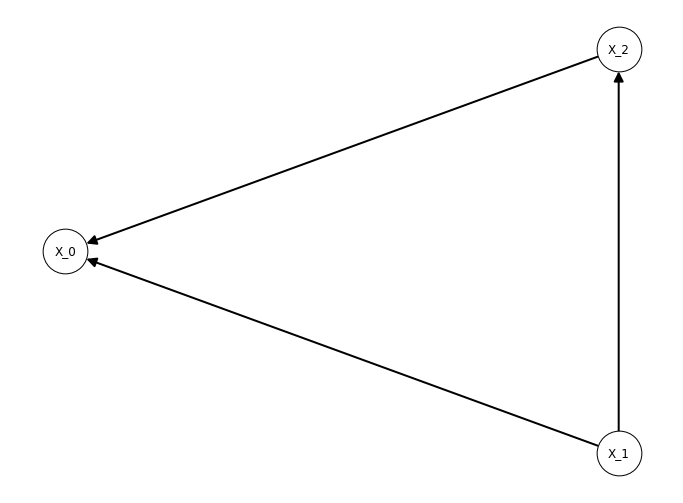

In [19]:
adj = np.loadtxt('./predG')
adj[adj < 0.3] = 0
g = nx.convert_matrix.from_numpy_array(adj, create_using=nx.DiGraph)
labels = {node: f"X_{node}" for node in g.nodes}
fig = plt.figure(figsize=(12, 9))
nx.draw_shell(g, with_labels=True, node_size=NODE_SIZE, node_color='white', width=2, arrowsize=ARROW_SIZE, linewidths=LINEWIDTH, edgecolors='black', labels=labels, ax=fig.add_subplot(111))

In [11]:
fig.savefig('./daggnn_pred_sachs_collider.svg')

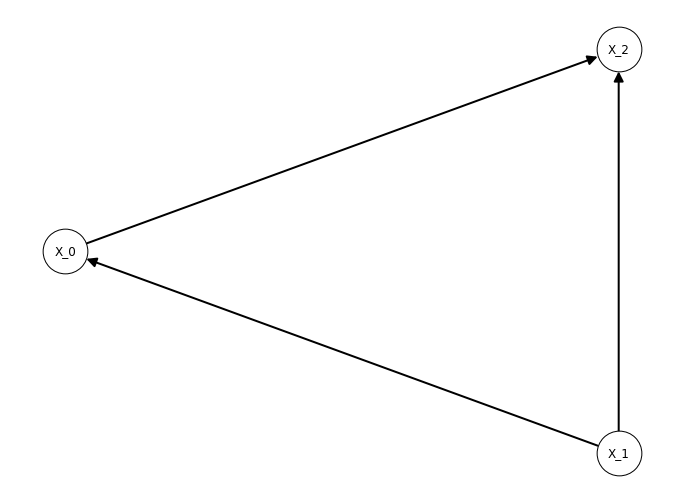

In [22]:
name = 'chain_reverse'
adj = np.loadtxt('./dag-gnn/predG')
adj[abs(adj) < 0.5] = 0
g = nx.convert_matrix.from_numpy_array(adj, create_using=nx.DiGraph)
labels = {node: f"X_{node}" for node in g.nodes}
fig = plt.figure(figsize=(12, 9))
nx.draw_shell(g, with_labels=True, node_size=NODE_SIZE, node_color='white', width=2, arrowsize=ARROW_SIZE, linewidths=LINEWIDTH, edgecolors='black', labels=labels, ax=fig.add_subplot(111))
plt.savefig(f'./figures/dg-predictions-3-nodes-non-linear/{name}.pdf')

In [112]:
adj

array([[ 0.     ,  0.     ,  0.     ,  0.     ,  0.     ,  0.     ,
         0.     ,  0.     ,  0.     ,  0.     ],
       [ 0.63396,  0.     ,  0.     ,  0.     ,  0.     ,  0.     ,
         0.     ,  0.     ,  0.     ,  0.     ],
       [ 0.     ,  0.67953,  0.     ,  0.     ,  0.     ,  0.     ,
         0.     ,  0.     ,  0.     ,  0.     ],
       [ 0.     ,  0.     ,  0.75682,  0.     ,  2.29693,  0.     ,
        -0.75961,  0.     ,  0.     ,  0.     ],
       [ 0.     ,  0.     ,  0.     ,  0.     ,  0.     ,  0.     ,
         0.     ,  0.     ,  0.     ,  0.     ],
       [ 0.     ,  0.     ,  0.     ,  0.63434,  4.01893,  0.     ,
         1.09763,  0.     ,  0.     ,  0.     ],
       [ 0.     ,  0.     ,  0.     ,  0.     , -2.20042,  0.     ,
         0.     ,  0.72719,  0.     ,  0.     ],
       [ 0.     ,  0.     ,  0.     ,  0.     ,  0.     ,  0.     ,
         0.     ,  0.     ,  0.68534,  0.     ],
       [ 0.     ,  0.     ,  0.     ,  0.     ,  0.     ,  0.   